In [1]:
import warnings
warnings.filterwarnings("ignore")
import glob
import torch
import time
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch.utils.data
import torchvision.transforms as transforms
from torch.autograd import Variable
from PIL import Image
from IPython.display import clear_output

In [2]:
import plotly
from plotly.offline import iplot
import plotly.graph_objs as go

In [3]:
plotly.offline.init_notebook_mode(connected=True)

In [4]:
import sys
sys.path.append("../pyfiles/")
from util import * 
from dataset import * 
from model import * 

# Get celebA dataset

In [5]:
label_discription = [
    "male, smiling",
    "male, not smiling",
    "female, smiling",
    "female, not smiling"
]

In [6]:
root = "./../../dataset/celebA/img/"
label_root = "./../../dataset/celebA/label_folder/"

In [7]:
# 1 5 o clock shadow
# 11 blurry
# 14 chubby
# 15 double chin
# 16 eyeglasses
# 17 goatee
# 21 male
# 23 mustache
# 25 No_Beard
# 31 sideburns
# 32 smiling
# 36 wearing hat
# 40 young
dataset_label = {}
dataset_label["existed"] = [25] 
dataset_label["delete"] = [1, 11, 14, 15, 16, 17, 23, 31, 36] 
dataset_label["class"] = [21, 32] 

In [8]:
classes = tuple(range(2**len(dataset_label["class"])))
cl = get_class_label(len(dataset_label["class"]))
classes

(0, 1, 2, 3)

In [9]:
normalize = transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])

class MinMax(object):
    def __init__(self, mean0=True):
        self.mean0 = mean0
        pass
    def __call__(self, img):
        return torch.Tensor(min_max(cuda2numpy(img), mean0=self.mean0))
    def __repr__(self):
        return self.__class__.__name__

transform = {}
transform["train"] = transforms.Compose([
    transforms.CenterCrop((178, 178)),
    transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    MinMax(True)
])
    
transform["test"] = transforms.Compose([
    transforms.CenterCrop((178, 178)),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    MinMax(True)
])

In [10]:
each_train_num = 10000000
each_val_num = 0
each_test_num = 100
dataset = FaceDataset(root, label_root, transform["train"], dataset_label, classes, data_type="train", train_num=each_train_num, val_num=each_val_num, test_num=each_test_num)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=256, shuffle=True)
testset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=each_val_num, test_num=each_test_num)
len(dataset), len(testset)

(134530, 400)

0


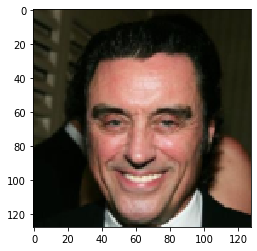

In [11]:
data = dataloader.dataset[24]
img = data[0]
image = image_from_output(torch.reshape(img, (1,img.shape[0],img.shape[1],img.shape[2])))[0]
print(data[1])
plt.imshow(image)

## Algorithm

In [12]:
class SingleGAN_training():
    def __init__(self, net, opt, criterion, lbd, unrolled_k, evice, ref_label,
                 batch_size=64, encoded_feature="latent", styleINdataset=True):
        self.G, self.D, self.E = net[0].to(device), net[1].to(device), net[2].to(device)
        self.optG, self.optD, self.optE = opt[0], opt[1], opt[2]
        self.scheG, self.scheD, self.scheE = None, None, None
        self.criterion, self.criterion_class = criterion
        self.lbd = lbd
        self.k = unrolled_k
        self.device = device
        self.ref_label = ref_label
        self.n_batch = batch_size
        self.encoded_feature = encoded_feature
        self.styleINdataset = styleINdataset
        self.source_image = None
        self.target_image = None
        self.recon_image = None
        self.label = None
        self.c_rand = None
        self.enc_info = None
        self.target_cenc = None
    
    def opt_sche_initialization(self, lr=[0.0001, 0.0001, 0.0001]):
        lr_G, lr_D, lr_E = lr
        if self.optG==None:
            self.optG = optim.Adam(self.G.parameters(), lr=lr_G, betas=(0.5, 0.999))
        self.scheG = optim.lr_scheduler.ExponentialLR(self.optG, gamma=0.95)
        if self.optD==None:
            self.optD = optim.Adam(self.D.parameters(), lr=lr_D, betas=(0.5, 0.999))
        self.scheD = optim.lr_scheduler.ExponentialLR(self.optD, gamma=0.95)
        if self.optE==None:
            self.optE = optim.Adam(self.E.parameters(), lr=lr_E, betas=(0.5, 0.999))
        self.scheE = optim.lr_scheduler.ExponentialLR(self.optE, gamma=0.95)
        return
        
    def G_transformation(self, target_label, source_image, encoder=False, ref_image=None):
        if encoder:
            latent, mu, logvar, class_output, attention = self.E(ref_image)
            info = [latent, mu, logvar, class_output, attention]
            if self.encoded_feature == "latent":
                latent_vector = latent
            elif self.encoded_feature == "mu":
                latent_vector = mu
                
        else:
            latent_vector = torch.randn(source_image.shape[0], ndim).to(device)
            info = latent_vector
            
        class_vector = class_encode(target_label, self.device, self.ref_label)
        class_vector = torch.cat([class_vector, latent_vector], 1)
        target_image = self.G(source_image, class_vector)
        
        return target_image, info
        
    def update_D(self):
        self.D.zero_grad()
        if styleINdataset:
            c, random = self.label["index"]
            self.target_image, [_,self.c_rand,_,_,_] = self.G_transformation(self.label["target"], self.source_image, True, self.source_image[c][random])
        else:
            self.target_image, self.c_rand = self.G_transformation(self.label["target"], self.source_image, False)
        
        errD = 0
        # real image
        output, output_class = self.D(self.source_image)
        errD_real = get_loss_D(output, 1., criterion, device)
        errD_class = get_domainloss_D(output_class, class_encode(label["source"], self.device, self.ref_label), criterion_class)
        errD += errD_real + errD_class*self.lbd["class"]

        # fake image
        output, output_class = self.D(self.target_image.detach())
        errD_fake = get_loss_D(output, 0., criterion, device)
        errD += errD_fake

        # gradient penalty
        if self.lbd["gp"] > 0:
            errD_gp = get_gradient_penalty(self.D, self.source_image, self.target_image.detach())
            errD += errD_gp * self.lbd["gp"]
            
        errD.backward()
        self.optD.step()
        return errD
    
    def update_GandE(self):
        self.G.zero_grad()
        self.E.zero_grad()

        errG = 0
        errE = 0
        errE_output = 0

        ## ordinary SingleGAN loss
        recon_image, source_enc_info = self.G_transformation(self.label["source"], self.target_image, True, self.source_image)
        output, output_class = self.D(self.target_image)
        errG_dis = get_loss_D(output, 1., criterion, device)
        errG_class = get_domainloss_D(output_class, class_encode(self.label["target"], self.device, self.ref_label), criterion_class)
        errG_cycle = torch.mean(torch.abs(self.source_image - recon_image))
        errG += errG_dis + errG_class*self.lbd["class"] + errG_cycle*self.lbd["cycle"]
        errE_output += errG_cycle * self.lbd["cycle"]
        
        ## multimodal transformation (KL): Conventional KL
        if self.lbd["KL"] > 0:
            _, mu, logvar, _, _ = source_enc_info
            errE_KL = -0.5 * torch.sum(1 + logvar - mu**2 - logvar.exp_()) 
            errE += errE_KL*self.lbd["KL"]
            errE_output += errE_KL*self.lbd["KL"]
            
        ## Identity loss under source style condition
        if self.lbd["idt"] > 0:
            identity_image, _ = self.G_transformation(self.label["source"], self.source_image, True, self.source_image)
            errG_idt = torch.mean(torch.abs(self.source_image - identity_image))
            errG += errG_idt*self.lbd["idt"]
            errE_output += errG_idt*self.lbd["idt"]
            
        ## encoder attention loss
        if self.lbd["attention"] > 0:
            _, _, _, _, attention = source_enc_info
            errE_att = get_focus_loss(attention, lbd=1)
            errE += errE_att*self.lbd["attention"]
            errE_output += errE_att*self.lbd["attention"]
        
        ## encoder classification loss
        if self.lbd["class_enc"] > 0:
            _, _, _, output_class_enc, _ = source_enc_info
            errE_class_enc = get_domainloss_D([output_class_enc], class_encode(self.label["source"], self.device, self.ref_label), criterion_class)
            errE += errE_class_enc*self.lbd["class_enc"]
            errE_output += errE_class_enc*self.lbd["class_enc"]
            
        ## batch size KL
        if self.lbd["batch_KL"] > 0:
            _, mu, _, _, _ = source_enc_info
            var = torch.var(mu, dim=0)*self.n_batch/(self.n_batch-1)
            mean = torch.mean(mu, dim=0)
            errE_bKL = -0.5 * torch.sum(1 + torch.log(var) - mean**2 - var) 
            errE += errE_bKL*self.lbd["batch_KL"]
            errE_output += errE_bKL*self.lbd["batch_KL"]
            
        ## correlative loss
            if self.lbd["corr_enc"] > 0:
                errE_corr = corrcoef_loss(mu.T, self.device)
                errE += errE_corr*self.lbd["corr_enc"]
                errE_output += errE_corr*self.lbd["corr_enc"]
                
        ## histgram imitation loss
            if self.lbd["hist"] > 0:
                errE_hist = hi.loss(mu)
                errE += errE_hist*self.lbd["hist"]
                errE_output += errE_hist*self.lbd["hist"]
                
        ## Consistency Regularization
        if self.lbd["consis_reg"] > 0:
            augmented = get_augmented_image(self.source_image, augment)
            _, augmented_mu, _, _, _ = self.E(augmented)
            _, source_mu, _, _, _ = source_enc_info
            
            errE_consis_reg = torch.mean(torch.abs(augmented_mu - source_mu)*2)
            errE += errE_consis_reg*self.lbd["consis_reg"]
            errE_output += errE_consis_reg*self.lbd["consis_reg"]
        
        errG.backward(retain_graph=True)
        errE.backward(retain_graph=True)
        self.optG.step()
        self.optE.step()
        
        ########################### update exclusively G ###########################
        self.G.zero_grad()
        self.E.zero_grad()
        
        errG_ex = 0
        ## multimodal transformation (regression loss)
        _, target_cenc, _, _, _ = self.E(self.target_image)
        errG_reg = torch.mean(torch.abs(self.c_rand - target_cenc))
        errG_ex += errG_reg * self.lbd["reg"]
        
        ## multimodal transformation (regression loss for identity images)
        if self.lbd["idt_reg"]*self.lbd["idt"] > 0:
            errG_idt_reg = 0
            
            ## random condition
            if styleINdataset:
                idt_random_image, [_,source_c_rand,_,_,_] = self.G_transformation(self.label["source"], self.source_image, True, self.source_image)
            else:
                idt_random_image, source_c_rand = self.G_transformation(self.label["source"], self.source_image, False)
            _, idt_cenc_rand, _, _, _ = self.E(idt_random_image)
            errG_idt_reg += torch.mean(torch.abs(source_c_rand - idt_cenc_rand))
            errG_ex += errG_idt_reg * self.lbd["idt_reg"] * (self.lbd["idt"]/self.lbd["cycle"])
            
        errG_ex.backward()
        self.optG.step()
        
        errG += errG_ex
        
        return [errG, errE_output]
    
    def UnrolledUpdate(self):
        for i in range(self.k):

            # update D
            errD = self.update_D()
            if i==0:
                paramD = self.D.state_dict()
                errorD = errD

        # update G
        errorG, errorE = self.update_GandE()

        self.D.load_state_dict(paramD)
        return [errorG, errorD, errorE]
        
    def train(self, source_image, label):
        self.source_image = source_image
        self.label = label
        error = self.UnrolledUpdate()
        return error

# conditional GAN

In [13]:
epoch_num = 31
lr_D = 0.0001
lr_G = 0.0002
lr_E = 0.001
# torch.cuda.set_device("cuda:4")
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [14]:
# ---- adjustable parameters ---- #
ndim = 8 # the dimension of noise vector, indicating the style
nch_in = 3
nch = 64
reduce = 2
num_cls = 2
res_num = 6
dis_reduce = 2
dis_nch = 64
dis_num_cls = 4

model_type = "nopretraining" # "nopretraining", "gradattention", "pretrained"
attention_mode = "relu" # this will be available when you set 'model_type' as "gradattention": "relu", "relumodified"
restriction_type = "conventionalKL" # "conventionalKL", "proposedKL"
styleINdataset = True
save_parameter = True
###################################

ref_label = np.eye(len(classes))
if restriction_type == "conventionalKL":
    encoded_feature = "latent" # "latent" or "mu"
elif restriction_type == "proposedKL":
    encoded_feature = "mu" # "latent" or "mu"
if styleINdataset:
    styleINdataset_or_not = "styleINdataset_"
else:
    styleINdataset_or_not = ""
hi = histogram_imitation(device)

In [15]:
devices = [0,1,2,3]
netG = SingleGenerator(nch_in, nch, reduce, num_cls, res_num, "instance", num_con=ref_label.shape[1]+ndim).to(device)
netG.apply(weights_init)
netG = nn.DataParallel(netG, devices)
netD = SingleDiscriminator_solo_multi(nch_in, dis_nch, dis_reduce, dis_num_cls, "instance", ref_label.shape[1]).to(device)
netD.apply(weights_init)
netD = nn.DataParallel(netD, devices)
if model_type in ["nopretraining", "pretrained"]:
    netE = Encoder(nch_in, ndim, nch, 4, "instance", ref_label.shape[1]).to(device)
elif model_type=="gradattention":
    netE = Encoder_gradattention(nch_in, ndim, nch, 4, "instance", ref_label.shape[1], attention_mode).to(device)
netE.apply(weights_init);

In [16]:
if model_type in ["gradattention", "pretrained"]:
    model_path = f"./model_parameters/Mpaper/72/facial_recognizer_lr0.0001_epoch51.pth"
    netE = load_classifier(netE, model_path)
    classifier = Encoder_classifier(nch_in, ndim, nch, 4, norm_type, ref_label.shape[1]).to(device)
    classifier_layers = list(classifier.state_dict().keys())
    netE.freeze_melt(classifier_layers, "freeze")
    optE = optim.Adam(filter(lambda p: p.requires_grad, netE.parameters()), lr=0.001, betas=(0.5, 0.999))
    netE.freeze_melt(classifier_layers, "melt");
else:
    optE = None
netE = nn.DataParallel(netE, devices)

In [17]:
criterion = nn.MSELoss()
criterion_class = nn.MSELoss()

## train

In [18]:
lbd = {}
lbd["class"] = 1
lbd["cycle"] = 5
lbd["idt"] = 5
lbd["reg"] = 0.5
lbd["idt_reg"] = 0.5
lbd["gp"] = 0
lbd["consis_reg"] = 0

if restriction_type == "conventionalKL":
    lbd["KL"] = 0.1
    lbd["batch_KL"] = 0
    lbd["corr_enc"] = 0
    lbd["hist"] = 0
elif restriction_type == "proposedKL":
    lbd["KL"] = 0
    lbd["batch_KL"] = 10
    lbd["corr_enc"] = 100
    lbd["hist"] = 100
    
if (model_type=="gradattention") and (attention_mode=="relumodified"):
    lbd["class_enc"] = 10
    lbd["attention"] = 1000
else:
    lbd["class_enc"] = 0
    lbd["attention"] = 0

unrolled_k = 5

In [19]:
each_train_num = 10000
batch_size = 128
dataset = FaceDataset(root, label_root, transform["train"], dataset_label, classes, data_type="train", train_num=each_train_num, val_num=0, test_num=100)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True)
sampleset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=0, test_num=16)
len(dataset), len(sampleset)

(40000, 64)

In [20]:
sg = SingleGAN_training([netG, netD, netE], [None, None, optE], [criterion, criterion_class], 
                       lbd, unrolled_k, device, ref_label, batch_size, encoded_feature)
sg.opt_sche_initialization()

31: 23.456779440244038 mins


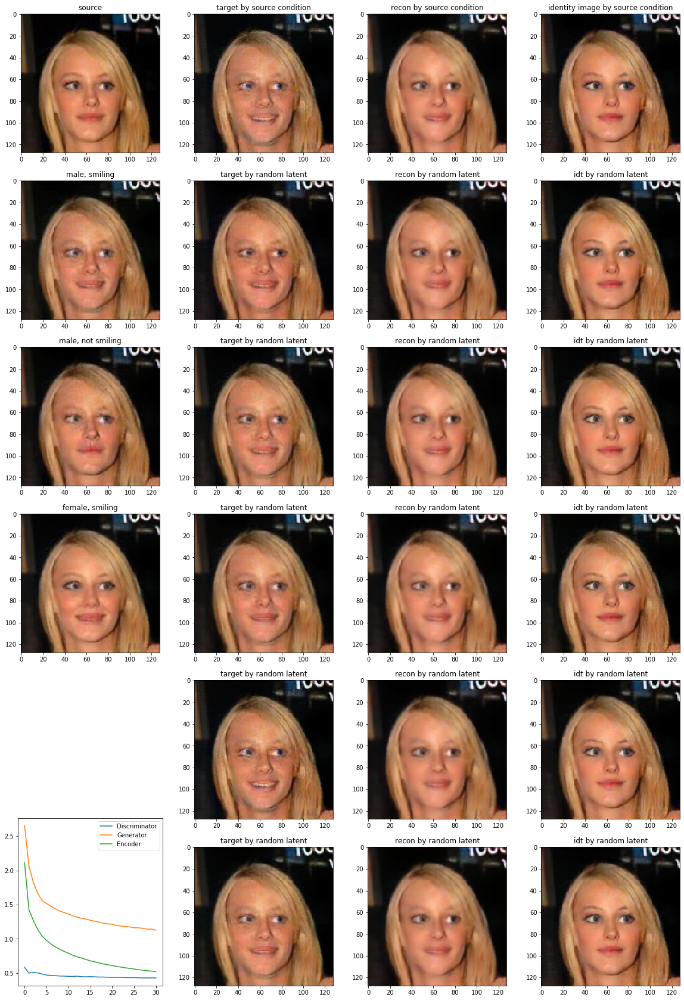

In [21]:
run_train = True
if run_train:
    interval = int(len(dataset)/batch_size/3) + 2
    losses_D = []
    losses_G = []
    losses_E = []
    for epoch in range(epoch_num):
        start_time = time.time()
        loss_D = []
        loss_G = []
        loss_E = []
        for itr, data in enumerate(dataloader):
            netG.train()
            data_image = data[0]
            data_label = data[1]

            source_image = data_image.to(device)
            label = {}

            label["source"] = data_label.to(device)
            whole_target = get_target(data_label, classes, whole=False)

            if styleINdataset:
                a = np.argsort(np.array(data_label))
                a_ = np.array(data_label)[a]
                b = list(a_)
                num = np.random.randint(1, 4)
                c = list(a)[b.index(num):] + list(a)[:b.index(num)]
                d = np.argsort(np.array(data_label))
                random = np.argsort(d)
                label["index"] = c, random
                label["target"] = data_label[c][random]
            else:
                label["target"] = torch.tensor(whole_target[:,0], dtype=torch.long, device="cpu")

            errG, errD, errE = sg.train(source_image, label)

            if type(errD)!=int:
                errD = errD.detach().to("cpu").numpy()
                loss_D.append(errD)
            if type(errG)!=int:
                errG = errG.detach().to("cpu").numpy()
                loss_G.append(errG)
            if type(errE)!=int:
                errE = errE.detach().to("cpu").numpy()
                loss_E.append(errE)

            if itr%interval==0:
                if not itr==0:
                    clear_output(wait=True)
                    print(f"epoch {epoch} :itr {itr}/{int(len(dataset)/batch_size)}: {(time.time()-start_time)/60} mins")
                    fig = get_output_and_plot(sg, sampleset, 53, [classes, label_discription], 5, styleINdataset, device)

                    if not epoch==0:
                        length = 5
                        width = 4
                        losses = [losses_D, losses_G, losses_E]
                        ax = fig.add_subplot(length, width, 17)
                        models = ["Discriminator", "Generator", "Encoder"]
                        for k in range(len(losses)):
                            if models[k] == "Discriminator":
                                if type(losses[k]) == dict:
                                    for i in classes:
                                        ax.plot(losses[k][i], label=f"Discriminator-{i}")
                                elif type(losses[k]) == list:
                                    ax.plot(losses[k], label=f"Discriminator")
                            else:
                                ax.plot(losses[k], label=models[k])
                        ax.legend()
                    plt.show()

        if save_parameter:
            if epoch % 3 == 0:

                dir = "./instant_model_parameter/"
                if model_type == "nopretraining":
                    gen_path = dir + f"gen_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{epoch}"
                    dis_path = dir + f"dis_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{epoch}"
                    enc_path = dir + f"enc_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{epoch}"

                elif model_type == "pretrained":
                    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"
                    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"
                    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"

                elif model_type == "gradattention":
                    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"
                    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"
                    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{epoch}"

                torch.save(sg.G.module.state_dict(), gen_path)
                torch.save(sg.D.module.state_dict(), dis_path)
                torch.save(sg.E.module.state_dict(), enc_path)


        sg.scheD.step()
        losses_D.append(np.mean(loss_D))
        sg.scheG.step()
        losses_G.append(np.mean(loss_G))
        sg.scheE.step()
        losses_E.append(np.mean(loss_E))

        clear_output(wait=True)
        print(f"{epoch+1}: {(time.time()-start_time)/60} mins")
        fig = get_output_and_plot(sg, sampleset, 53, [classes, label_discription], 5, styleINdataset, device)

        length = 5
        width = 4
        losses = [losses_D, losses_G, losses_E]
        ax = fig.add_subplot(length, width, 17)
        models = ["Discriminator", "Generator", "Encoder"]
        for k in range(len(losses)):
            if models[k] == "Discriminator":
                if type(losses[k]) == dict:
                    for i in classes:
                        ax.plot(losses[k][i], label=f"Discriminator-{i}")
                elif type(losses[k]) == list:
                    ax.plot(losses[k], label=f"Discriminator")
            else:
                ax.plot(losses[k], label=models[k])
        ax.legend()

        plt.show()

## Results

In [21]:
import pandas as pd

models = [["conventionalKL", False],
          ["conventionalKL", True],
          ["proposedKL", False],
          ["proposedKL", True]]

pd.DataFrame(np.array(models), columns=["restriction_type", "styleINdataset"])

,restriction_type,styleINdataset
0,conventionalKL,False
1,conventionalKL,True
2,proposedKL,False
3,proposedKL,True


In [64]:
###############################################
############ adjustable parameters ############

restriction_type = "conventionalKL" # "conventionalKL", "proposedKL"
styleINdataset = False

###############################################
###############################################

model_type = "nopretraining" # "nopretraining", "gradattention", "pretrained"
attention_mode = "" # this will be available when you set 'model_type' as "gradattention": "relu", "relumodified"

if restriction_type == "conventionalKL":
    encoded_feature = "latent" # "latent" or "mu"
elif restriction_type == "proposedKL":
    encoded_feature = "mu" # "latent" or "mu"
if styleINdataset:
    styleINdataset_or_not = "styleINdataset_"
else:
    styleINdataset_or_not = ""

In [65]:
lbd = {}
lbd["cycle"] = 5
lbd["idt"] = 5
lbd["class"] = 1
lbd["reg"] = 0.5
lbd["idt_reg"] = 0.5
lbd["gp"] = 0
lbd["consis_reg"] = 0

if restriction_type == "conventionalKL":
    lbd["KL"] = 0.1
    lbd["batch_KL"] = 0
    lbd["corr_enc"] = 0
    lbd["hist"] = 0
elif restriction_type == "proposedKL":
    lbd["KL"] = 0
    lbd["batch_KL"] = 10
    lbd["corr_enc"] = 100
    lbd["hist"] = 100
    
if (model_type=="gradattention") and (attention_mode=="relumodified"):
    lbd["class_enc"] = 10
    lbd["attention"] = 1000
else:
    lbd["class_enc"] = 0
    lbd["attention"] = 0

unrolled_k = 5

In [66]:
netG = SingleGenerator(nch_in, nch, reduce, num_cls, res_num, "instance", num_con=ref_label.shape[1]+ndim).to(device)
netD = SingleDiscriminator_solo_multi(nch_in, dis_nch, dis_reduce, dis_num_cls, "instance", ref_label.shape[1]).to(device)
if model_type in ["nopretraining", "pretrained"]:
    netE = Encoder(nch_in, ndim, nch, 4, "instance", ref_label.shape[1]).to(device)
elif model_type=="gradattention":
    netE = Encoder_gradattention(nch_in, ndim, nch, 4, "instance", ref_label.shape[1], attention_mode).to(device)
sg = SingleGAN_training([netG, netD, netE], [None, None, optE], [criterion, criterion_class], 
                       lbd, unrolled_k, device, ref_label, batch_size, encoded_feature)
sg.opt_sche_initialization()

In [68]:
load_epoch = 30
dir = "./instant_model_parameter/"
if model_type == "nopretraining":
    gen_path = dir + f"gen_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"

elif model_type == "pretrained":
    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"

elif model_type == "gradattention":
    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"

gen_model = torch.load(gen_path)
enc_model = torch.load(enc_path)
dis_model = torch.load(dis_path)

netG.load_state_dict(gen_model)
netE.load_state_dict(enc_model)
netD.load_state_dict(dis_model)
gen_path

FileNotFoundError: [Errno 2] No such file or directory: './instant_model_parameter/gen_modified_SingleGAN_idt5_cycle5_gp0_KL0.1_reg0.5_classenc0_idtreg0.5_attention0_consisreg0_unrolledk5_epoch30'

In [55]:
num = 100
testset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=0, test_num=num)

In [43]:
dataloader = torch.utils.data.DataLoader(dataset=testset, batch_size=1000, shuffle=False)
for itr, data in enumerate(dataloader):
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    if itr==0:
        labels = cuda2cpu(data_label)
        samples = cuda2cpu(data_image)
    else:
        labels = np.concatenate([labels, cuda2cpu(data_label)], axis=0)
        samples = torch.cat([samples, cuda2cpu(data_image)], axis=0)

In [44]:
dataloader = torch.utils.data.DataLoader(dataset=testset, batch_size=128, shuffle=False)
for itr, data in enumerate(dataloader):
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    if styleINdataset:
        _, mu, _, _, _ = netE(data_image)
    if itr==0:
        if styleINdataset:
            mu_list = cuda2cpu(mu)
        labels = cuda2cpu(data_label)
        samples = cuda2cpu(data_image)
    else:
        if styleINdataset:
            mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)
        labels = np.concatenate([labels, cuda2cpu(data_label)], axis=0)
        samples = torch.cat([samples, cuda2cpu(data_image)], axis=0)
if styleINdataset:
    latent = mu_list
else:
    latent = np.random.randn(num, ndim)

In [45]:
index = len(testset) - 11
target_label = 2
data, label = get_samples(netG, netE, testset, index, latent, classes, ref_label, ndim, image_type="pil", batch=32, device=device, conventional_E=False)

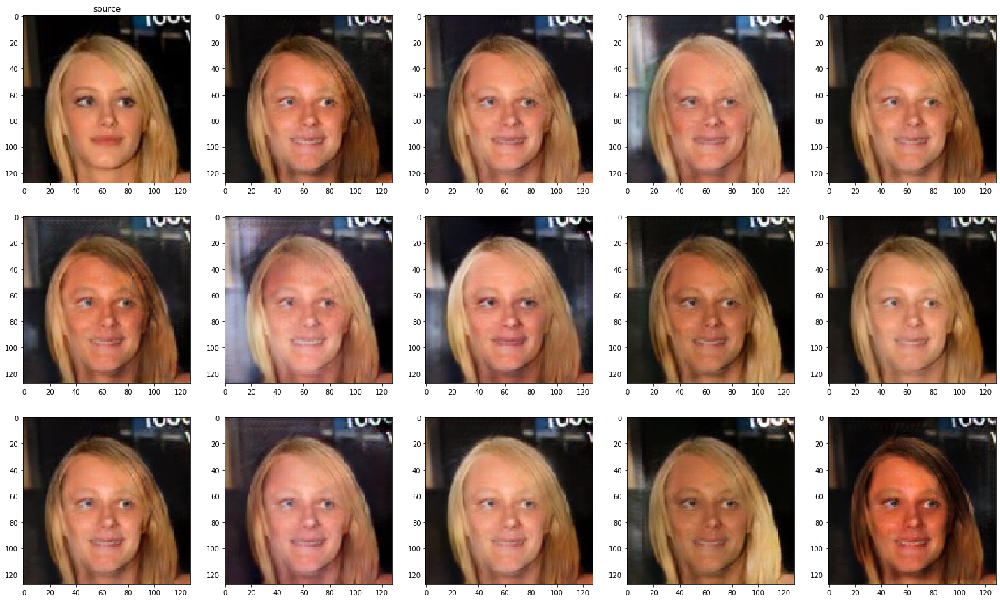

In [46]:
length = 3
width = 5
images = data["target"][0]

np.random.seed(0)
a = np.random.choice(np.arange(num), length*width-1, False)
fig = plt.figure(figsize=(5*width, 5*length))
index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")

for i in range(length*width-1):
    index = i+2
    ax = fig.add_subplot(length, width, index)
    ax.imshow(images[a[i]])

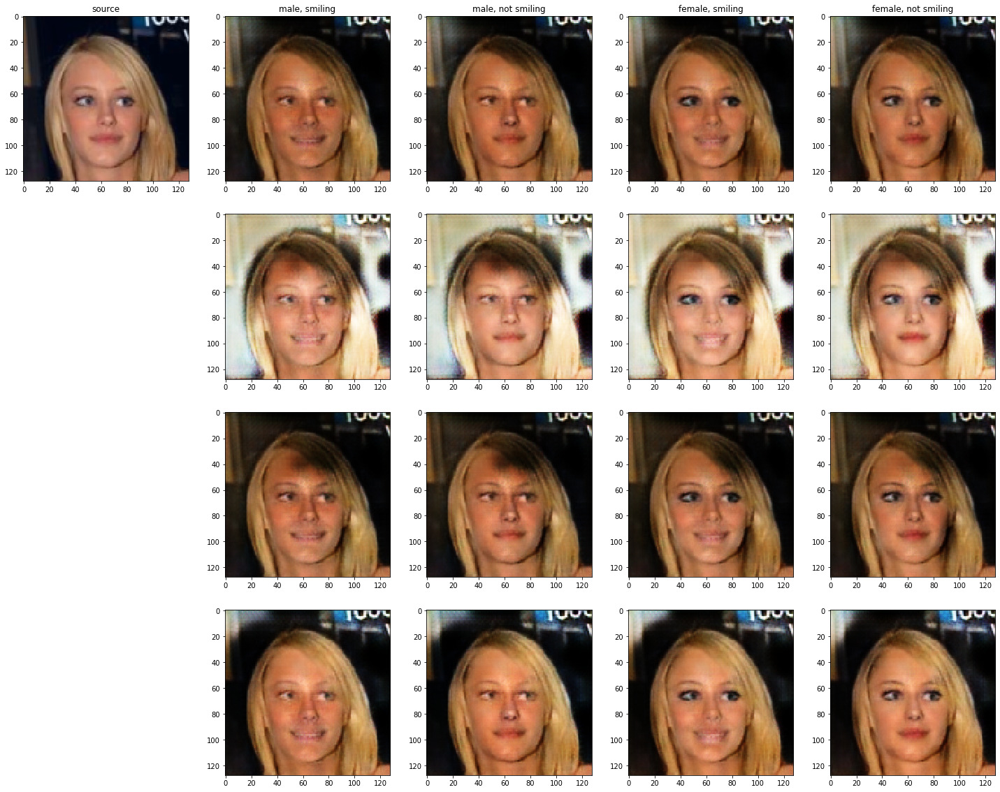

In [67]:
length = 4
images = data["target"]

width = len(classes)+1
fig = plt.figure(figsize=(5*width, 5*length))
np.random.seed(0)
a = np.random.choice(np.arange(num), length, False)
index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")

for i in range(length):
    for j in classes:
        index = i*(len(classes)+1)+j+2
        ax = fig.add_subplot(length, width, index)
        ax.imshow(images[j][a[i]])
        if i == 0:
            ax.set_title(label_discription[j])

In [2]:
import os 
import glob

In [3]:
root = "../data/parameters/"

In [8]:
path_list = glob.glob(root + "*/*")
path_list.sort()
path_list[6:]

['../data/parameters/02/enc_modified_SingleGAN_idt0_cycle10_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/02/enc_modified_SingleGAN_idt1_cycle10_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/02/enc_modified_SingleGAN_idt5_cycle5_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/02/gen_modified_SingleGAN_idt0_cycle10_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/02/gen_modified_SingleGAN_idt1_cycle10_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/02/gen_modified_SingleGAN_idt5_cycle5_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30',
 '../data/parameters/03/enc_modified_SingleGAN_idt5_cycle5_gp0_KL0_reg0.5_classenc0_idtreg0.5_attention0_consisreg0_unrolledk5_epoch30',
 '../data/parameters/03/enc_modified_

In [10]:
path

'../data/parameters/02/enc_modified_SingleGAN_idt0_cycle10_gp0_KL0.1_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30'

In [23]:
model_type = "nopretraining" # "nopretraining", "gradattention", "pretrained"
attention_mode = "relu" # this will be available when you set 'model_type' as "gradattention": "relu", "relumodified"
encoded_feature = "mu" # "latent" or "mu"
restriction_type = "proposedKL" # "conventionalKL", "proposedKL"
styleINdataset = True

if styleINdataset:
    styleINdataset_or_not = "styleINdataset_"
else:
    styleINdataset_or_not = ""
    
lbd = {}
lbd["class"] = 1
lbd["cycle"] = 5
lbd["idt"] = 5
lbd["reg"] = 0.5
lbd["idt_reg"] = 0
lbd["gp"] = 0
lbd["consis_reg"] = 0

if restriction_type == "conventionalKL":
    lbd["KL"] = 0.1
    lbd["batch_KL"] = 0
    lbd["corr_enc"] = 0
    lbd["hist"] = 0
elif restriction_type == "proposedKL":
    lbd["KL"] = 0
    lbd["batch_KL"] = 10
    lbd["corr_enc"] = 100
    lbd["hist"] = 100
    
if (model_type=="gradattention") and (attention_mode=="relumodified"):
    lbd["class_enc"] = 10
    lbd["attention"] = 1000
else:
    lbd["class_enc"] = 0
    lbd["attention"] = 0

unrolled_k = 1

In [25]:
netG = SingleGenerator(nch_in, nch, reduce, num_cls, res_num, "instance", num_con=ref_label.shape[1]+ndim).to(device)
netD = SingleDiscriminator_solo_multi(nch_in, dis_nch, dis_reduce, dis_num_cls, "instance", ref_label.shape[1]).to(device)
if model_type in ["nopretraining", "pretrained"]:
    netE = Encoder(nch_in, ndim, nch, 4, "instance", ref_label.shape[1]).to(device)
elif model_type=="gradattention":
    netE = Encoder_gradattention(nch_in, ndim, nch, 4, "instance", ref_label.shape[1], attention_mode).to(device)
sg = SingleGAN_training([netG, netD, netE], [None, None, optE], [criterion, criterion_class], 
                       lbd, unrolled_k, device, ref_label, batch_size, encoded_feature)
sg.opt_sche_initialization()

In [26]:
load_epoch = 30
styleINdataset_or_not = ""
dir = "./instant_model_parameter/"
if model_type == "nopretraining":
    gen_path = dir + f"gen_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_modified_SingleGAN_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_unrolledk{unrolled_k}_epoch{load_epoch}"

elif model_type == "pretrained":
    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"

elif model_type == "gradattention":
    gen_path = dir + f"gen_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    dis_path = dir + f"dis_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"
    enc_path = dir + f"enc_Style-RestrictedGAN_type-{model_type}-{attention_mode}_{styleINdataset_or_not}idt{lbd['idt']}_cycle{lbd['cycle']}_gp{lbd['gp']}_KL{lbd['KL']}_reg{lbd['reg']}_classenc{lbd['class_enc']}_idtreg{lbd['idt_reg']}_bKL{lbd['batch_KL']}_correnc{lbd['corr_enc']}_attention{lbd['attention']}_consisreg{lbd['consis_reg']}_hist{lbd['hist']}_unrolledk{unrolled_k}_epoch{load_epoch}"

gen_model = torch.load(gen_path)
enc_model = torch.load(enc_path)
dis_model = torch.load(dis_path)

netG.load_state_dict(gen_model)
netE.load_state_dict(enc_model)
netD.load_state_dict(dis_model)
gen_path

'./instant_model_parameter/gen_modified_SingleGAN_idt5_cycle5_gp0_KL0_reg0.5_classenc0_idtreg0_attention0_consisreg0_unrolledk1_epoch30'

In [61]:
# netE = nn.DataParallel(netE, devices)

In [27]:
num = 250
testset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=0, test_num=num)
dataset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="train", train_num=num, val_num=0, test_num=0)

In [28]:
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=1000, shuffle=False)
for itr, data in enumerate(dataloader):
    data_image = data[0]
    data_label = data[1]
    
    if itr==0:
        train_labels = cuda2cpu(data_label)
        train_samples = cuda2cpu(data_image)
    else:
        train_labels = np.concatenate([train_labels, cuda2cpu(data_label)], axis=0)
        train_samples = torch.cat([train_samples, cuda2cpu(data_image)], axis=0)

In [30]:
dataloader = torch.utils.data.DataLoader(dataset=testset, batch_size=128, shuffle=False)
for itr, data in enumerate(dataloader):
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    _, mu, _, _, _ = netE(data_image)
    if itr==0:
        mu_list = cuda2cpu(mu)
        labels = cuda2cpu(data_label)
        samples = cuda2cpu(data_image)
    else:
        mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)
        labels = np.concatenate([labels, cuda2cpu(data_label)], axis=0)
        samples = torch.cat([samples, cuda2cpu(data_image)], axis=0)
latent = mu_list

In [31]:
num = 1000
testset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=0, test_num=num)
dataset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="train", train_num=num, val_num=0, test_num=0)

In [33]:
dataloader = torch.utils.data.DataLoader(dataset=testset, batch_size=128, shuffle=False)
for itr, data in enumerate(dataloader):
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    _, mu, _, _, _ = netE(data_image)
    if itr==0:
        mu_list = cuda2cpu(mu)
        _labels = cuda2cpu(data_label)
        _samples = cuda2cpu(data_image)
    else:
        mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)
        _labels = np.concatenate([_labels, cuda2cpu(data_label)], axis=0)
        _samples = torch.cat([_samples, cuda2cpu(data_image)], axis=0)
_latent = mu_list

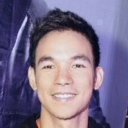

In [34]:
index = len(testset)//len(classes) - 16
image_from_output(testset[index][0].unsqueeze(0))[0]

In [46]:
def dic_init(get_edge=False):
    data = {}
    data["source"] = []
    data["target"] = []
    data["recon"] = []
    label = {}
    label["source"] = []
    label["target"] = []
    return data, label

def get_samples_latent(netG, netE, dataset, index, target_label, latent=None, classes=tuple(range(4)), ref_label=None, 
                       ndim=8, scale=1, image_type="pil", batch=32, device="cuda"):
    """
    get samples of the outputs in multimodal-SingleGAN, which is diversified the output with the latent code
    
    Parameters
    ------------
    netG : PyTorch model
        the generator of the SingleGAN
        
    dataset : Dataset in PyTorch
        dataset which is used in the inference task
        
    index : int
        the index which indicates data location in the dataset
        
    target_label : ndarray
        the index which indicates data location in the dataset
        
    latent : None or ndarray, shape=(sample_num, latent_dim)
        latent indicates the "style" of generated data
        
    classes : tuple
        the class list(tuple)
        
    ref_label : ndarray
        continuous class label (relational label or moving label)
        
    label_type : 'target_only', 'concatenation', or 'substruction'
        the target label for transformation
        'target_only' -> only target label
        'concatenation' -> concatenation of the target label and the source label
        'substruction' -> substruction of the target label and the source label
        
    transformation_type : 'normal', 'edge', or 'edge_emphasis'
        the represenation which is used for the input of the E
        
    ndim : int 
        the dimension of the latent code
    
    Returns
    ----------
    data : dic
        dictionary of whole data
        
    label : dic
        dictionary of whole label
        
    """
    
    fixed_source_image = dataset[index][0].view(1, 3, 128, 128).to(device)
    fixed_source_label = torch.tensor([dataset[index][1]])
    target_label = torch.tensor([target_label])
    
    data, label = dic_init(False)
    label["latent"] = []
    label["source"] = cuda2numpy(fixed_source_label)
    if image_type=="pil":
        data["source"] = image_from_output(fixed_source_image)[0]
    elif image_type=="tensor":
        data["source"] = cuda2cpu(fixed_source_image)[0]

    netG.eval()
    netE.eval()
    # get target image
    if type(latent)==np.ndarray:
        latent = torch.tensor(latent, dtype=torch.float32).to(device)
    else:
        latent = torch.randn(fixed_source_image.shape[0], ndim).to(device) * scale
        
    num = latent.shape[0]
    for itr in range(num//batch+int(bool(num-batch*(num//batch)))):
        class_vector = class_encode(target_label, device, ref_label, fixed_source_label)
        latent_ = latent[itr*batch:(itr+1)*batch, :]
        class_vector = torch.cat([class_vector.repeat(latent_.shape[0],1), latent_], 1)
        target_image = netG(fixed_source_image.repeat(latent_.shape[0],1,1,1), class_vector)
        _, mu, _, _, _ = netE(target_image)
        label["latent"].append(cuda2numpy(mu))
        if image_type=="pil":
            data["target"] += image_from_output(target_image)
        elif image_type=="tensor":
            target_image = cuda2numpy(target_image)
            if itr == 0:
                data["target"] = target_image
            else:
                data["target"] = np.concatenate([data["target"], target_image], axis=0)
    if image_type=="tensor":
        data["source"] = torch.Tensor(data["source"]).unsqueeze(0)
        data["target"] = torch.Tensor(np.array(data["target"]))
    return data, label

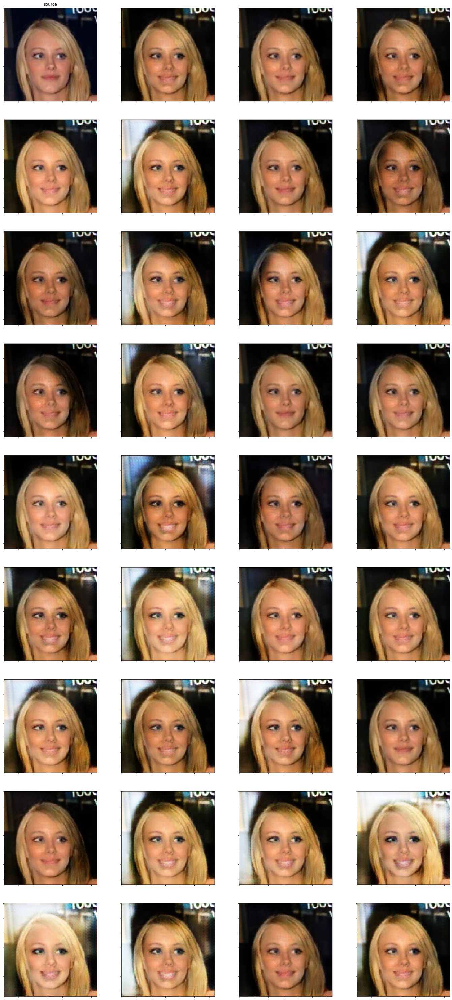

In [48]:
index = len(testset) - 11
# index = len(testset)//len(classes) - 16
target_label = 2
a = np.random.choice(np.arange(num*4), num*4, False)

length = 9
width = 4
each_size = 6
fig = plt.figure(figsize=(each_size*width, each_size*length))
# data, label = get_samples_latent(netG, netE, testset, index, target_label, latent[a][:length*width-1], classes, ref_label, label_type, transformation_type, ndim, image_type="pil", batch=32)
data, label = get_samples_latent(netG, netE, testset, index, target_label, latent[labels==target_label][:length*width-1], classes, ref_label, ndim, image_type="pil", batch=32, device=device)
images = data["target"]

index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")
ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False) 

for i in range(length*width-1):
    index = i+2
    ax = fig.add_subplot(length, width, index)
    ax.imshow(images[i])
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)

In [68]:
from sho_implementation.sho_util.util_GAN_evaluation import GAN_evaluation
# fe_list = ["inception", "facial", "facial-feature_reduction"]
fe_list = ["inception", "facial"]#, "facial-feature_reduction"]
index = len(testset) - 11
# index = len(testset) - 12
target_label = 2
step = 0.1

# data, label = get_samples_latent(netG, netE, testset, index, target_label, latent, classes, ref_label, label_type, transformation_type, ndim, image_type="tensor", batch=32)
data, label = get_samples_latent(netG, netE, testset, index, target_label, _latent[_labels==target_label], classes, ref_label, label_type, transformation_type, ndim, image_type="tensor", batch=32)

In [69]:
lbd = {}
lbd["gradattention"] = 1
lbd["consis_regularization"] = 1

ge = GAN_evaluation("facial", device, classes, [target_label], lbd) # "facial", "facial-gradattention", "inception"
metrics = ge.get_prdc(_samples[_labels==target_label], data["target"], preprocess=True, thres=0.2)
metrics

Num real: 1000 Num fake: 1000


{'precision': 1.0, 'recall': 0.015, 'density': 1.3118, 'coverage': 0.175}

In [97]:
columns = []
for fe in fe_list:
    clear_output(wait=True)
    print(fe)
    ge = GAN_evaluation(fe, device, classes, [target_label], lbd) # "facial", "facial-gradattention", "inception"
    if fe=="inception" or fe=="facial":
        columns.append(fe)
        metrics = ge.get_prdc(samples, data["target"], preprocess=True)
        if fe=="inception":
            scores = np.array(list(metrics.values())).reshape(1, 4)
        else:
            scores = np.concatenate([scores, np.array(list(metrics.values())).reshape(1, 4)], axis=0)
    elif fe=="facial-feature_reduction":
        for i in np.arange(int(1/step)+1)*step:
            metrics = ge.get_prdc(samples, data["target"], preprocess=True, thres=i)
            scores = np.concatenate([scores, np.array(list(metrics.values())).reshape(1, 4)], axis=0)
            columns.append(f"{fe}-{np.round(i, 2)}")
clear_output(wait=True)
df = pd.DataFrame(scores, index=columns, columns=list(metrics.keys()))
df

inception


Downloading: "https://github.com/pytorch/vision/archive/v0.6.0.zip" to /opt/.cache/torch/hub/v0.6.0.zip
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /opt/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth
59.0%


KeyboardInterrupt: 

In [70]:
def evaluation_init(fe_list, classes, metrics):
    GAN_eval = {}
    for fe in fe_list:
        GAN_eval[fe] = {}
        for source_label in classes:
            GAN_eval[fe][source_label] = {}
            for target_label in classes:
                GAN_eval[fe][source_label][target_label] = {}
                GAN_eval[fe][source_label][target_label] = {}
                for metric in metrics.keys():
                    GAN_eval[fe][source_label][target_label][metric] = []
    return GAN_eval

In [72]:
sample_num = 100
init = True

if init:
    GAN_eval = evaluation_init(fe_list, classes, metrics)
    start = 0
else:
    start = len(GAN_eval[fe_list[0]][0][0]["coverage"])
for source_label in classes:
    clear_output(wait=True)
    print(source_label)
    for target_label in classes:
        for i in range(sample_num):
            index = source_label*num + (start+i)
#             data, label = get_samples_latent(netG, netE, testset, index, target_label, latent, classes, ref_label, label_type, transformation_type, ndim, image_type="tensor", batch=32)
            data, label = get_samples_latent(netG, netE, testset, index, target_label, _latent[_labels==target_label], classes, ref_label, label_type, transformation_type, ndim, image_type="tensor", batch=32)
            for fe in fe_list:
                ge = GAN_evaluation(fe, device, classes, [target_label], lbd) # "facial", "facial-feature_reduction", "inception"
                metrics = ge.get_prdc(_samples[_labels==target_label], data["target"], preprocess=True)
                for metric in metrics.keys():
                    GAN_eval[fe][source_label][target_label][metric].append(metrics[metric])

3


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


Using cache found in /opt/.cache/torch/hub/pytorch_vision_v0.6.0


Num real: 1000 Num fake: 1000
Num real: 1000 Num fake: 1000


In [74]:
save = False
path = "./data/results/75/GAN_evalation_ControlGAN-class_pretrained.pkl"

def pickle_save(data, path):
    with open(path, 'wb') as f:
        pickle.dump(data, f)
if save:
    pickle_save(GAN_eval, path)

In [75]:
load = True
path = "./data/results/75/GAN_evalation_ControlGAN_1000.pkl"

if load:
    a = pickle_load(path)

In [485]:
source_label = 3
target_label = 2

scores = []
for fe in fe_list:
    for metric in metrics.keys():
        scores.append(np.mean(GAN_eval[fe][source_label][target_label][metric]))
pd.DataFrame(np.array(scores).reshape(2,4), index=fe_list, columns=list(metrics.keys()))

,precision,recall,density,coverage
inception,0.99595,0.000,0.38663,0.0080
facial,0.95890,0.008,0.94343,0.0535


In [486]:
fe = 'facial'
metric = "coverage"

scores = []
for source_label in classes:
    for target_label in classes:
        scores.append(np.mean(GAN_eval[fe][source_label][target_label][metric]))
pd.DataFrame(np.array(scores).reshape(4,4), index=classes, columns=classes)

,0,1,2,3
0,0.04860,0.06255,0.0422,0.07440
1,0.06125,0.03820,0.0607,0.06560
2,0.03665,0.06725,0.0493,0.06625
3,0.04695,0.04565,0.0535,0.03470


In [459]:
pd.DataFrame(np.array(scores).reshape(2,4), index=fe_list, columns=list(metrics.keys()))

,precision,recall,density,coverage
inception,0.9902,0.0000,0.33232,0.0062
facial,0.9918,0.0102,1.01212,0.0474


In [255]:
step = 0.01
ge = GAN_evaluation("facial-gradattention", device, classes, [target_label]) # "facial", "facial-gradattention", "inception"
for i in np.arange(int(1/step)+1)*step:
    clear_output(wait=True)
    print(i)
    metrics = ge.get_prdc(samples, data["target"], preprocess=True, thres=i)
    scores = np.concatenate([scores, np.array(list(metrics.values())).reshape(1, 4)], axis=0)
    if i==0:
        ga_scores = np.array(list(metrics.values())).reshape(1, 4)
    else:
        ga_scores = np.concatenate([ga_scores, np.array(list(metrics.values())).reshape(1, 4)], axis=0)

1.0
Num real: 1000 Num fake: 1000


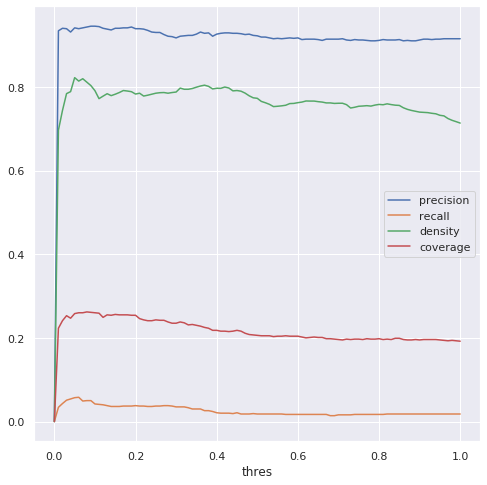

In [256]:
import seaborn as sns
sns.set()

plt.figure(figsize=(8,8))

ga_scores[ga_scores==None] = 0
plt.plot(np.arange(int(1/step)+1)*step, ga_scores[:,0], label=list(metrics.keys())[0])
plt.plot(np.arange(int(1/step)+1)*step, ga_scores[:,1], label=list(metrics.keys())[1])
plt.plot(np.arange(int(1/step)+1)*step, ga_scores[:,2], label=list(metrics.keys())[2])
plt.plot(np.arange(int(1/step)+1)*step, ga_scores[:,3], label=list(metrics.keys())[3])

plt.xlabel("thres")
plt.legend()

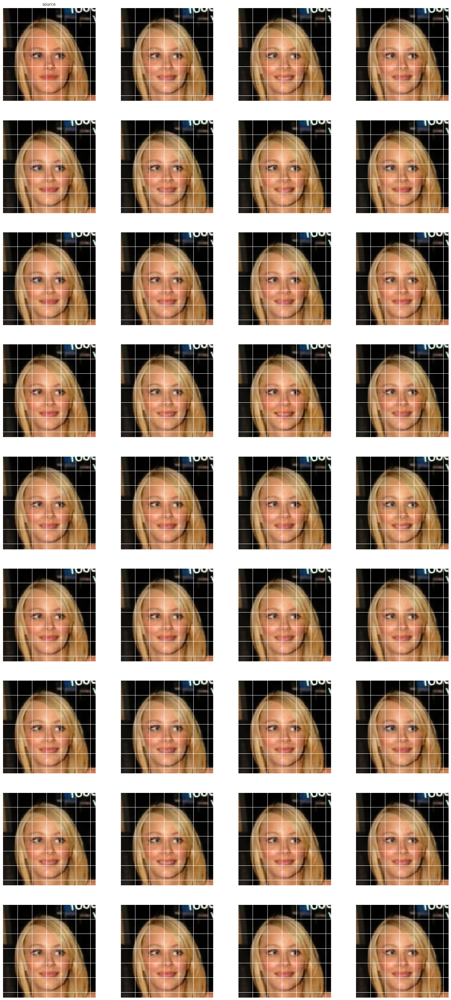

In [289]:
index = len(testset) - 11
target_label = 2
data, label = get_samples_latent(netG, netE, testset, index, target_label, latent[labels==target_label], classes, ref_label, label_type, transformation_type, ndim, image_type="pil", batch=32)

length = 9
width = 4
each_size = 6
fig = plt.figure(figsize=(each_size*width, each_size*length))
images = data["target"]

index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")
ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False) 

for i in range(length*width-1):
    index = i+2
    ax = fig.add_subplot(length, width, index)
    ax.imshow(images[i])
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
#     ax.imshow(data["recon"][i])

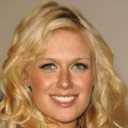

In [77]:
image_from_output(train_samples[train_labels==target_label][0:1])[0]

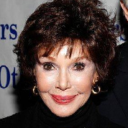

In [78]:
image_from_output(samples[labels==target_label][0:1])[0]

In [124]:
data, label = get_samples_latent(netG, netE, testset, len(testset)-11, 2, latent, classes, ref_label, label_type, transformation_type, ndim, image_type="tensor")
# data, label = get_samples_latent(netG, netE, testset, 14, 0, latent_code, classes, ref_label, label_type, transformation_type, ndim)
# data, label = get_samples_latent_multitransform(netG, netE, testset, 14, 1, 2, latent_code, classes, ref_label, label_type, transformation_type, ndim)
data["target"][0]
image_from_output(data["target"][0:1])[0]

KeyboardInterrupt: 

In [108]:
data["target"]

torch.Size([1, 3, 128, 128])

In [60]:
# fig = get_output_and_plot(sg, testset, 14, 5, True)
# fig = get_output_and_plot(sg, testset, 53, 5, True)

### generation in various latent code

In [420]:
netE.get_attention.state_dict()

OrderedDict([('a', tensor([0.5256], device='cuda:0'))])

In [421]:
all_dataset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=10000, val_num=0, test_num=1000)
all_dataloader = torch.utils.data.DataLoader(dataset=all_dataset, batch_size=32, shuffle=True)

for itr, data in enumerate(all_dataloader):
    clear_output(wait=True)
    print(itr)
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    ref_image = edge_transformation(data_image, transformation_type, None, device)
    latent, mu, logvar, class_output, attention = netE(ref_image)
    
    if itr==0:
        mu_list = cuda2cpu(mu)
    else:
        mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)

124


(array([247443.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,  47469.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
       dtype=float32),
 <a list of 10 Patch objects>)

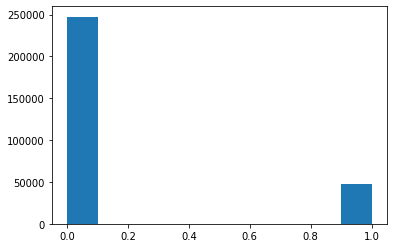

In [422]:
plt.hist(cuda2numpy(attention).reshape(-1))

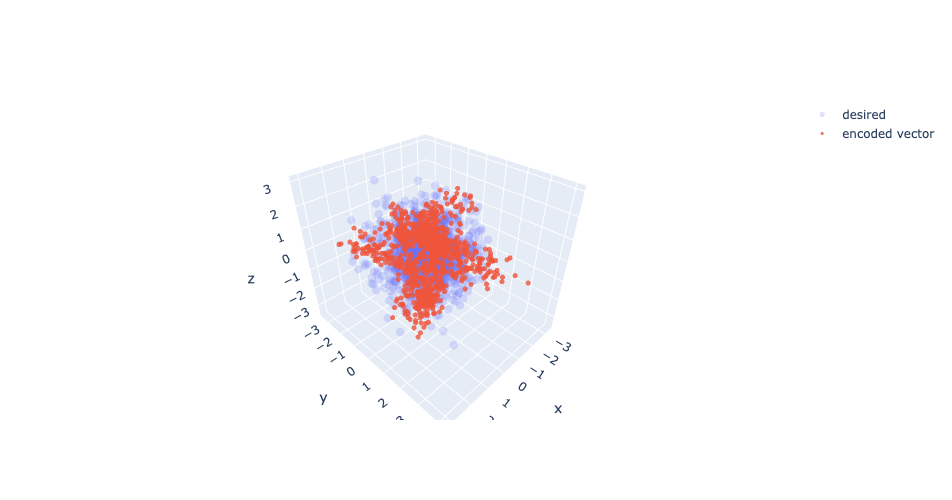

In [424]:
sample_num = 1000

trace = []
m = np.random.randn(1000, 3)
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"desired", 
                          marker = dict(size=5, opacity=0.2)))

m = mu_list[:sample_num,0:]
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"encoded vector", 
                          marker = dict(size=3, opacity=0.8)))


layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

In [425]:
num = 64
np.random.seed(0)
latent_code = np.random.randn(num, ndim) #* np.sqrt(10)
latent_code = mu_list[np.random.choice(np.arange(mu_list.shape[0]), size=num, replace=False), :]

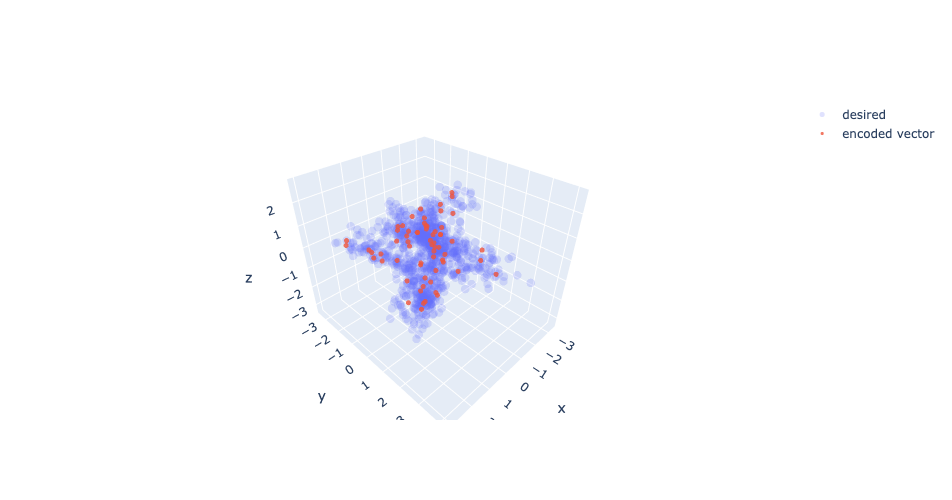

In [426]:
sample_num = 1000

trace = []
m = mu_list[:sample_num,0:]
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"desired", 
                          marker = dict(size=5, opacity=0.2)))

# num = 18
# m = latent_code[num:num+1,0:]
m = latent_code
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"encoded vector", 
                          marker = dict(size=3, opacity=0.8)))


layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

In [427]:
def get_samples_latent(netG, netE, dataset, index, target_label, latent=None, classes=tuple(range(4)), ref_label=None, 
                       label_type="target_only", transformation_type="normal", ndim=8, scale=1):
    """
    get samples of the outputs in multimodal-SingleGAN, which is diversified the output with the latent code
    
    Parameters
    ------------
    netG : PyTorch model
        the generator of the SingleGAN
        
    dataset : Dataset in PyTorch
        dataset which is used in the inference task
        
    index : int
        the index which indicates data location in the dataset
        
    target_label : ndarray
        the index which indicates data location in the dataset
        
    latent : None or ndarray, shape=(sample_num, latent_dim)
        latent indicates the "style" of generated data
        
    classes : tuple
        the class list(tuple)
        
    ref_label : ndarray
        continuous class label (relational label or moving label)
        
    label_type : 'target_only', 'concatenation', or 'substruction'
        the target label for transformation
        'target_only' -> only target label
        'concatenation' -> concatenation of the target label and the source label
        'substruction' -> substruction of the target label and the source label
        
    transformation_type : 'normal', 'edge', or 'edge_emphasis'
        the represenation which is used for the input of the E
        
    ndim : int 
        the dimension of the latent code
    
    Returns
    ----------
    data : dic
        dictionary of whole data
        
    label : dic
        dictionary of whole label
        
    """
    
    fixed_source_image = dataset[index][0].view(1, 3, 128, 128).to(DEVICE)
    fixed_source_label = torch.tensor([dataset[index][1]])
    sample_source = image_from_output(fixed_source_image)[0]
    target_label = torch.tensor([target_label])
    
    data, label = dic_init(True)
    label["latent"] = []
    label["source"] = cuda2numpy(fixed_source_label)
    data["source"] = image_from_output(fixed_source_image)[0]
    data["edge"]["source"] = image_from_output(edge_transformation(fixed_source_image, "edge", device=DEVICE))[0]
    data["edge_emphasis"]["source"] = image_from_output(edge_transformation(fixed_source_image, "edge_emphasis", device=DEVICE))[0]
    data["source"] = image_from_output(fixed_source_image)[0]

    netG.eval()
    # get target image
    if type(latent)==np.ndarray:
        latent = torch.tensor(latent, dtype=torch.float32).to(DEVICE)
    else:
        latent = torch.randn(fixed_source_image.shape[0], ndim).to(DEVICE) * scale
    for i in range(latent.shape[0]):
        class_vector = class_encode(target_label, DEVICE, ref_label, label_type, fixed_source_label)
        class_vector = torch.cat([class_vector, latent[i:i+1, :]], 1)
        target_image = netG(fixed_source_image, class_vector)
        ref_image = edge_transformation(target_image, transformation_type, None, device)
        _, mu, _, _, _ = netE(ref_image)
        label["latent"].append(cuda2numpy(mu))
        data["target"].append(image_from_output(target_image)[0])
        data["edge"]["target"].append(image_from_output(edge_transformation(target_image, "edge", device=DEVICE))[0])
        data["edge_emphasis"]["target"].append(image_from_output(edge_transformation(target_image, "edge_emphasis", device=DEVICE))[0])
#         data["target"].append(image_from_output(target_image)[0])
    return data, label

In [428]:
def get_samples_latent_multitransform(netG, netE, dataset, index, mid_label, target_label, latent=None, classes=tuple(range(4)), ref_label=None, 
                       label_type="target_only", transformation_type="normal", ndim=8, scale=1):
    """
    get samples of the outputs in multimodal-SingleGAN, which is diversified the output with the latent code
    
    Parameters
    ------------
    netG : PyTorch model
        the generator of the SingleGAN
        
    dataset : Dataset in PyTorch
        dataset which is used in the inference task
        
    index : int
        the index which indicates data location in the dataset
        
    target_label : ndarray
        the index which indicates data location in the dataset
        
    latent : None or ndarray, shape=(sample_num, latent_dim)
        latent indicates the "style" of generated data
        
    classes : tuple
        the class list(tuple)
        
    ref_label : ndarray
        continuous class label (relational label or moving label)
        
    label_type : 'target_only', 'concatenation', or 'substruction'
        the target label for transformation
        'target_only' -> only target label
        'concatenation' -> concatenation of the target label and the source label
        'substruction' -> substruction of the target label and the source label
        
    transformation_type : 'normal', 'edge', or 'edge_emphasis'
        the represenation which is used for the input of the E
        
    ndim : int 
        the dimension of the latent code
    
    Returns
    ----------
    data : dic
        dictionary of whole data
        
    label : dic
        dictionary of whole label
        
    """
    
    fixed_source_image = dataset[index][0].view(1, 3, 128, 128).to(DEVICE)
    fixed_source_label = torch.tensor([dataset[index][1]])
    sample_source = image_from_output(fixed_source_image)[0]
    mid_label = torch.tensor([mid_label])
    target_label = torch.tensor([target_label])
    
    data, label = dic_init(True)
    label["latent"] = []
    data["mid"] = []
    label["source"] = cuda2numpy(fixed_source_label)
    data["source"] = image_from_output(fixed_source_image)[0]
    data["edge"]["source"] = image_from_output(edge_transformation(fixed_source_image, "edge", device=DEVICE))[0]
    data["edge_emphasis"]["source"] = image_from_output(edge_transformation(fixed_source_image, "edge_emphasis", device=DEVICE))[0]
    data["source"] = image_from_output(fixed_source_image)[0]

    netG.eval()
    # get target image
    if type(latent)==np.ndarray:
        latent = torch.tensor(latent, dtype=torch.float32).to(DEVICE)
    else:
        latent = torch.randn(fixed_source_image.shape[0], ndim).to(DEVICE) * scale
    for i in range(latent.shape[0]):
        class_vector = class_encode(mid_label, DEVICE, ref_label, label_type, fixed_source_label)
        class_vector = torch.cat([class_vector, latent[i:i+1, :]], 1)
        mid_image = netG(fixed_source_image, class_vector)
        
        class_vector = class_encode(target_label, DEVICE, ref_label, label_type, mid_label)
        class_vector = torch.cat([class_vector, latent[i:i+1, :]], 1)
        target_image = netG(mid_image, class_vector)
        
        
#         ref_image = edge_transformation(target_image, transformation_type, None, device)
#         _, mu, _, _, _ = netE(ref_image)

        label["latent"].append(cuda2numpy(mu))
        data["mid"].append(image_from_output(mid_image)[0])
        data["target"].append(image_from_output(target_image)[0])
    return data, label

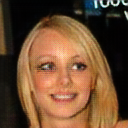

In [429]:
data, label = get_samples_latent(netG, netE, testset, len(testset)-11, 2, latent_code, classes, ref_label, label_type, transformation_type, ndim)
# data, label = get_samples_latent(netG, netE, testset, 14, 0, latent_code, classes, ref_label, label_type, transformation_type, ndim)
# data, label = get_samples_latent_multitransform(netG, netE, testset, 14, 1, 2, latent_code, classes, ref_label, label_type, transformation_type, ndim)
data["target"][0]

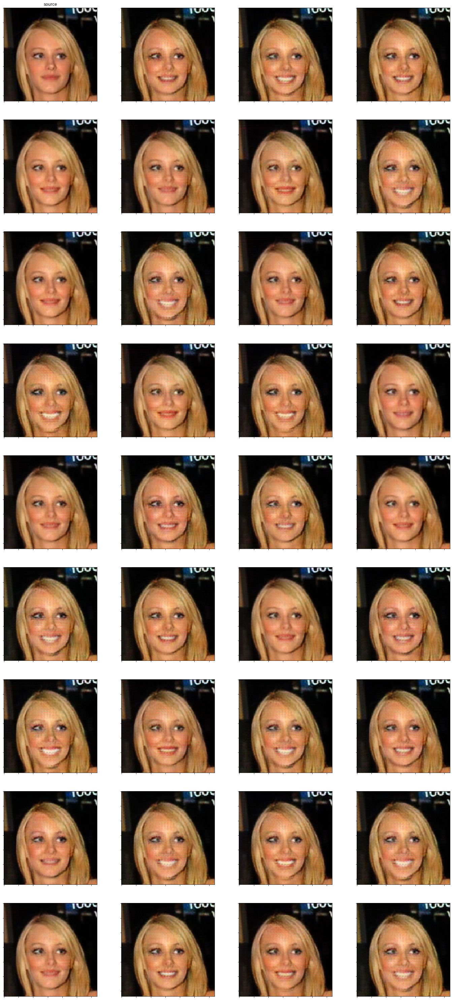

In [430]:
length = 9
width = 4
each_size = 6
fig = plt.figure(figsize=(each_size*width, each_size*length))
images = data["target"]

index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")
ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False) 

for i in range(length*width-1):
    index = i+2
    ax = fig.add_subplot(length, width, index)
    ax.imshow(images[i])
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
#     ax.imshow(data["recon"][i])

In [96]:
# data, label = get_samples_latent(netG, netE, testset, 14, 0, latent_code, classes, ref_label, label_type, transformation_type, ndim)
# data, label = get_samples_latent(netG, netE, testset, 53, 2, latent_code, classes, ref_label, label_type, transformation_type, ndim)

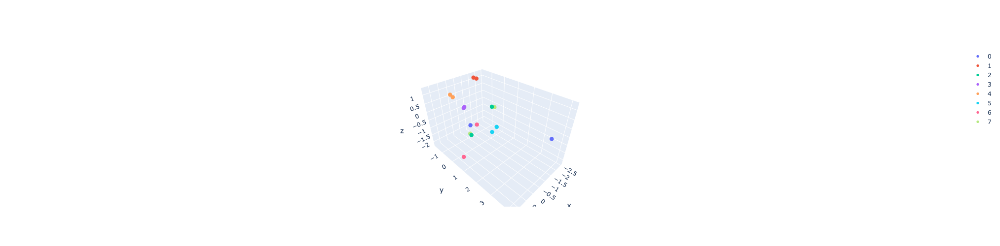

In [97]:
data_num = 8
trace = []
# a = cuda2numpy(source_cenc.view(data_num,1,-1))
# b = cuda2numpy(target_cenc.view(data_num,1,-1))
a = latent_code[:data_num,:].reshape(data_num,1,-1)
b = np.array(label["latent"])[:data_num]

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

In [98]:
normal_save = False
edge_save = False
edge_emphasis_save = False
if normal_save:
    # normal image gif
#     save_path = f"pic/61/normal-image_{transformation_type}.gif"
    save_path = f"test.gif"
    save_gif(data["target"], save_path, duration=150)

if edge_save:
    # edge image gif
    save_path = f"pic/61/edge-image_{transformation_type}.gif"
    save_gif(data["edge"]["target"], save_path, duration=200)

if edge_emphasis_save:
    # edge-emphasized image gif
    save_path = f"pic/61/emphasized-image_{transformation_type}.gif"
    save_gif(data["edge_emphasis"]["target"], save_path, duration=200)

### Encoder

In [99]:
sampleset = FaceDataset(root, label_root, transform["test"], dataset_label, classes, data_type="test", train_num=each_train_num, val_num=0, test_num=100)
sampleloader = torch.utils.data.DataLoader(dataset=sampleset, batch_size=32, shuffle=True)
len(sampleset)

400

In [100]:
sg.E = netE
sg.G = netG
sg.D = netD

In [101]:
for itr, data in enumerate(sampleloader):
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    ref_image = edge_transformation(data_image, transformation_type, None, device)
    latent, mu, logvar, class_output, attention = netE(ref_image)
    
    # audgmented image
    augmented_image = get_augmented_image(data_image, augment).to(device)
    ref_image = edge_transformation(augmented_image, sg.transformation_type, None, sg.device)
    _, augmented_mu, _, _, _ = netE(ref_image)
    
    fixed_target_label = torch.tensor(get_target(data_label, classes, whole=False, shuffle=False))
    target_label = fixed_target_label[:,0:1]
    target_image, [_,rand_enc,_,_,_] = sg.G_transformation(target_label, data_image, True, data_image)
    ref_image = edge_transformation(target_image, transformation_type, None, device)
    _, mu_target, _, _, _ = netE(ref_image)
    
    if itr==0:
        latent_list = cuda2cpu(latent)
        mu_list = cuda2cpu(mu)
        logvar_list = cuda2cpu(logvar)
        if class_output is not None:
            class_output_list = cuda2cpu(class_output)
        true_label = cuda2cpu(data_label)
        mu_target_list = cuda2cpu(mu_target)
        rand_enc_list = cuda2cpu(rand_enc)
        if attention is not None:
            attention_list = cuda2cpu(attention)
        augmented_mu_list = cuda2cpu(augmented_mu)
        data_image_list = cuda2cpu(data_image)
        augmented_image_list = cuda2cpu(augmented_image)
    else:
        latent_list = np.concatenate([latent_list, cuda2cpu(latent)], axis=0)
        mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)
        logvar_list = np.concatenate([logvar_list, cuda2cpu(logvar)], axis=0)
        if class_output is not None:
            class_output_list = np.concatenate([class_output_list, cuda2cpu(class_output)], axis=0)
        true_label = np.append(true_label, cuda2cpu(data_label))
        mu_target_list = np.concatenate([mu_target_list, cuda2cpu(mu_target)], axis=0)
        rand_enc_list = np.concatenate([rand_enc_list, cuda2cpu(rand_enc)], axis=0)
        if attention is not None:
            attention_list = np.concatenate([attention_list, cuda2cpu(attention)], axis=0)
        augmented_mu_list = np.concatenate([augmented_mu_list, cuda2cpu(augmented_mu)], axis=0)
        data_image_list = np.concatenate([data_image_list, cuda2cpu(data_image)], axis=0)
        augmented_image_list = np.concatenate([augmented_image_list, cuda2cpu(augmented_image)], axis=0)

#### classification

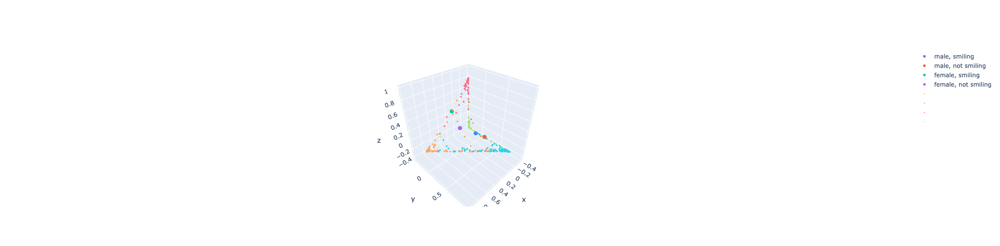

In [102]:
trace = []
for lbl in range(len(classes)):
    m = continuous_label[lbl:lbl+1]
    _x = m[:, 0]
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{label_discription[classes[lbl]]}", 
                              marker = dict(size=5)))
    
for lbl in range(len(classes)):
    m = class_output_list[true_label==lbl]
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"", 
                              marker = dict(size=2)))

layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

In [103]:
pred_label = np.argmax(class_output_list, axis=1)
(true_label == pred_label).sum() / len(pred_label)

0.825

#### augmented feature

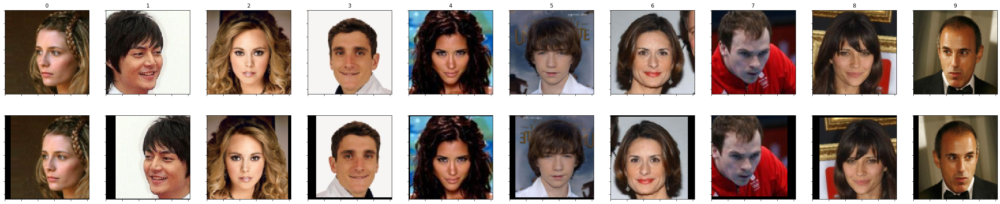

In [96]:
length = 2
width = 10
each_size = 4
fig = plt.figure(figsize=(each_size*width, each_size*length))

for i in range(length//2*width):
    index = i+1
    ax = fig.add_subplot(length, width, index)
    a = torch.tensor(data_image_list[i])
    image = image_from_output(torch.reshape(a, (1,a.shape[0],a.shape[1],a.shape[2])))[0]
    ax.imshow(image)
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
    ax.set_title(str(i))
    
for i in range(length//2*width):
    index = i+1+width
    ax = fig.add_subplot(length, width, index)
    a = torch.tensor(augmented_image_list[i])
    image = image_from_output(torch.reshape(a, (1,a.shape[0],a.shape[1],a.shape[2])))[0]
    ax.imshow(image)
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)

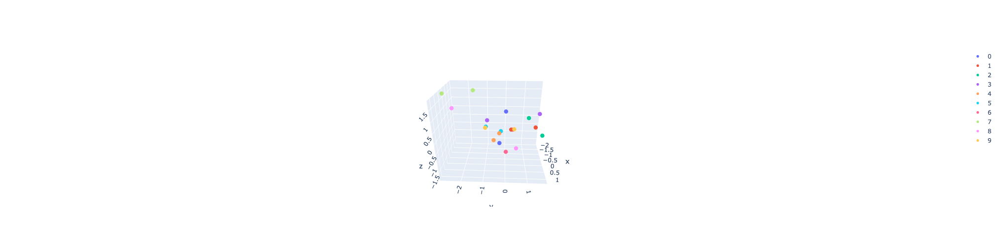

In [97]:
trace = []
    
display_num = 10
a = mu_list.reshape(len(sampleset),1,-1)
b = augmented_mu_list.reshape(len(sampleset),1,-1)

for i in range(display_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

In [342]:
np.std(mu_list, axis=0)
# np.mean(mu_list, axis=0)

array([1.1171055 , 1.1272008 , 1.0380706 , 0.97626495, 1.0883172 ,
       1.1110995 , 1.1583233 , 1.1164923 ], dtype=float32)

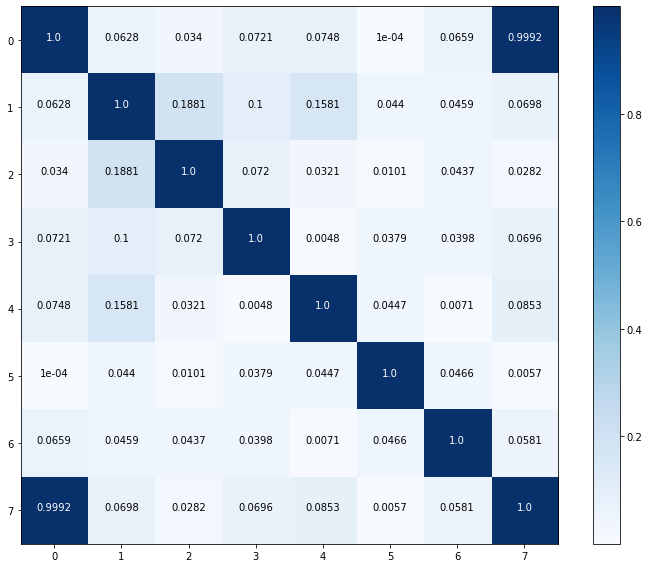

In [345]:
def plot_correlation_matrix(cm):
    cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(10, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()

    thresh = cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, str(round(cm[i, j], 4)),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.show()
plot_correlation_matrix(np.abs(np.array(corrcoef(torch.tensor(mu_list.T)))))
# plot_correlation_matrix(np.array(corrcoef(torch.tensor(mu_list.T))))

In [128]:
a = np.random.randn(100000, 8)
b = mu_list[:,:]
a = torch.tensor(a)
b = torch.tensor(b)

Text(0.5, 1.0, 'plt histogram')

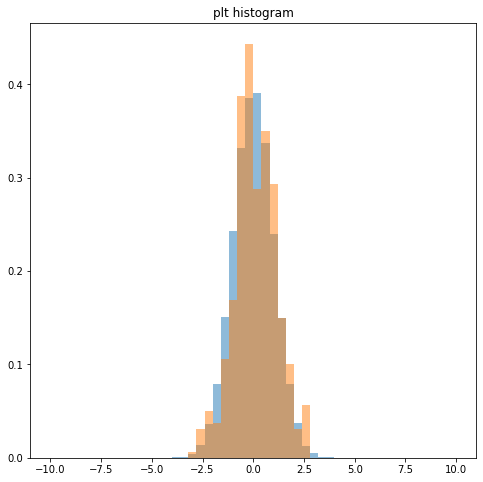

In [129]:
range_max = 10
bins = 50

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1)
ax.hist(cuda2numpy(a[:,0]), bins=bins, range=(-range_max, range_max), density=True, alpha=0.5, label="desired");
ax.hist(cuda2numpy(b[:,3]), bins=bins, range=(-range_max, range_max), density=True, alpha=0.5, label="training")
ax.set_title("plt histogram")

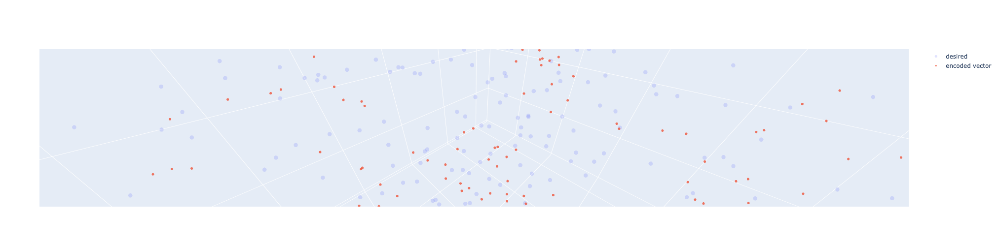

In [130]:
trace = []

m = np.random.randn(1000, 3)
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"desired", 
                          marker = dict(size=5, opacity=0.2)))

m = mu_list[:,2:]
_x = m[:, 0] 
_y = m[:, 1]
_z = m[:, 2]
trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"encoded vector", 
                          marker = dict(size=3, opacity=0.8)))


layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

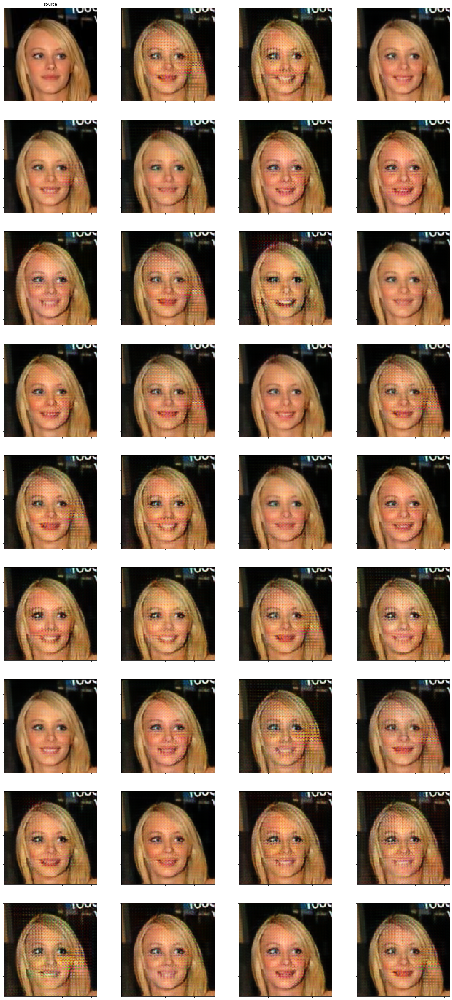

In [131]:
num = 64
latent_code = mu_list[:num,:]

data, label = get_samples_latent(netG, netE, testset, 53, 2, latent_code, classes, ref_label, label_type, transformation_type, ndim)
# data, label = get_samples_latent(netG, testset, 14, 0, latent_code, classes, ref_label, label_type, transformation_type, ndim)

length = 9
width = 4
each_size = 6
fig = plt.figure(figsize=(each_size*width, each_size*length))

index = 1
ax = fig.add_subplot(length, width, index)
ax.imshow(data["source"])
ax.set_title("source")
ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False) 

for i in range(length*width-1):
    index = i+2
    ax = fig.add_subplot(length, width, index)
    ax.imshow(data["target"][i])
    ax.tick_params(labelbottom=False, labelleft=False, labelright=False, labeltop=False)
#     ax.imshow(data["recon"][i])

#### qualitative evaluation

In [324]:
target_random_list = []
recon_source_list = []
recon_random_list = []
idt_source_list = []
idt_random_list = []
for itr, data in enumerate(sampleloader):
    netE.eval()
    data_image = data[0].to(device)
    data_label = data[1].to(device)
    
    # target: random
    ref_image = get_random_dataset(dataset, len(data_label)).to(device)
    target_image, c_rand = sg.G_transformation(data_label, data_image, True, ref_image)
    target_c_rand = c_rand[1]
    
    ref_image = edge_transformation(target_image, transformation_type, None, device)
    _, target_cenc_rand, _, _, _ = netE(ref_image)
    target_random = np.mean(np.abs(cuda2numpy(target_c_rand) - cuda2numpy(target_cenc_rand)))
    print("target: random: ", target_random)
    target_random_list.append(target_random)
          
    
    # recon: source
    recon_image, source_enc_info = sg.G_transformation(data_label, target_image, True, data_image)
    ref_image = edge_transformation(recon_image, transformation_type, None, device)
    _, source_cenc, _, _, _ = source_enc_info
    _, recon_cenc, _, _, _ = netE(ref_image)
    recon_source = np.mean(np.abs(cuda2numpy(recon_cenc) - cuda2numpy(source_cenc)))
    print("recon : source: ", recon_source)
    recon_source_list.append(recon_source)
    
    # recon: random
    source_target_image, c_rand = sg.G_transformation(data_label, data_image, True, data_image)
    if styleINdataset:
        ref_image = get_random_dataset(dataset, len(data_label)).to(device)
        recon_random_image, [_,source_c_rand,_,_,_] = sg.G_transformation(data_label, source_target_image, True, ref_image)
    else:
        recon_random_image, source_c_rand = sg.G_transformation(data_label, target_image, False)
    ref_image = edge_transformation(recon_random_image, transformation_type, None, device)
    _, recon_cenc_rand, _, _, _ = netE(ref_image)
    recon_random = np.mean(np.abs(cuda2numpy(source_c_rand) - cuda2numpy(recon_cenc_rand)))
    print("recon : random: ", recon_random)
    recon_random_list.append(recon_random)
    
    # idt: source
    idt_image, source_enc_info = sg.G_transformation(data_label, data_image, True, data_image)
    ref_image = edge_transformation(idt_image, transformation_type, None, device)
    _, source_cenc, _, _, _ = source_enc_info
    _, idt_cenc, _, _, _ = netE(ref_image)
    idt_source = np.mean(np.abs(cuda2numpy(idt_cenc) - cuda2numpy(source_cenc)))
    print("idt   : source: ", idt_source)
    idt_source_list.append(idt_source)
    
    # idt: random
    if styleINdataset:
        ref_image = get_random_dataset(dataset, len(data_label)).to(device)
        idt_random_image, [_,source_c_rand,_,_,_] = sg.G_transformation(data_label, data_image, True, ref_image)
    else:
        idt_random_image, source_c_rand = sg.G_transformation(data_label, data_image, False)
    
    ref_image = edge_transformation(idt_random_image, transformation_type, None, device)
    _, idt_cenc_rand, _, _, _ = netE(ref_image)
    idt_random = np.mean(np.abs(cuda2numpy(source_c_rand) - cuda2numpy(idt_cenc_rand)))
    print("idt   : random: ", idt_random)
    idt_random_list.append(idt_random)
    
    print("---------------------------------------")
    
    if itr==0:
        latent_list = cuda2cpu(latent)
        mu_list = cuda2cpu(mu)
        logvar_list = cuda2cpu(logvar)
        if class_output is not None:
            class_output_list = cuda2cpu(class_output)
        true_label = cuda2cpu(data_label)
    else:
        latent_list = np.concatenate([latent_list, cuda2cpu(latent)], axis=0)
        mu_list = np.concatenate([mu_list, cuda2cpu(mu)], axis=0)
        logvar_list = np.concatenate([logvar_list, cuda2cpu(logvar)], axis=0)
        if class_output is not None:
            class_output_list = np.concatenate([class_output_list, cuda2cpu(class_output)], axis=0)
        true_label = np.append(true_label, cuda2cpu(data_label))
print("total:")
print("target: random: ", np.array(idt_random_list).mean())
print("recon : source: ", np.array(recon_source_list).mean())
print("recon : random: ", np.array(recon_random_list).mean())
print("idt   : source: ", np.array(idt_source_list).mean())
print("idt   : random: ", np.array(idt_random_list).mean())

target: random:  0.34121948
recon : source:  0.38801986
recon : random:  0.8536022
idt   : source:  0.4602398
idt   : random:  0.34851438
---------------------------------------
target: random:  0.39066684
recon : source:  0.44077578
recon : random:  1.0147164
idt   : source:  0.49432147
idt   : random:  0.4154908
---------------------------------------
target: random:  0.370209
recon : source:  0.37951344
recon : random:  0.72505593
idt   : source:  0.37646633
idt   : random:  0.35944712
---------------------------------------
target: random:  0.36408356
recon : source:  0.4613403
recon : random:  0.83845913
idt   : source:  0.48973557
idt   : random:  0.37420452
---------------------------------------
target: random:  0.42085457
recon : source:  0.4841261
recon : random:  0.8472278
idt   : source:  0.50441575
idt   : random:  0.41373068
---------------------------------------
target: random:  0.38423532
recon : source:  0.39473253
recon : random:  0.8068979
idt   : source:  0.4005218

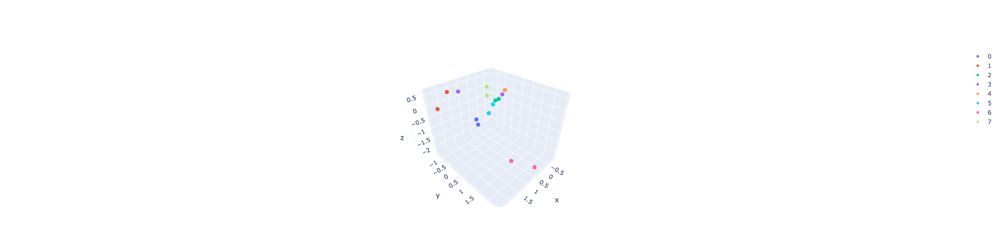

In [325]:
# target under source condition
data_num = 8
for itr, data in enumerate(sampleloader):
    
    sg.G.eval()
    sg.E.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    target_label = torch.tensor(get_target(data_label, classes, whole=False, shuffle=False))[:,1:2]
    target_image, [_,source_cenc,_,_,_] = sg.G_transformation(target_label, data_image, True, data_image)
    ref_image = edge_transformation(target_image, transformation_type, None, device)
    _, target_cenc, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(source_cenc.view(data_num,1,-1))
b = cuda2numpy(target_cenc.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

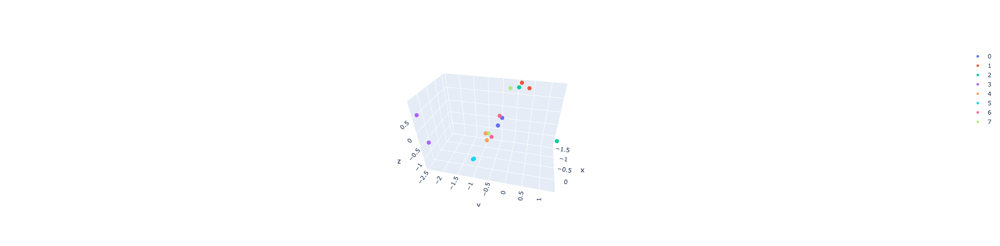

In [326]:
# target under random condition
data_num = 8
for itr, data in enumerate(sampleloader):
    
    netE.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    target_label = torch.tensor(get_target(data_label, classes, whole=False, shuffle=False))[:,0:1]
    if styleINdataset:
        ref_image = get_random_dataset(dataset, len(data_label)).to(device)
        target_image, [_,target_c_rand,_,_,_] = sg.G_transformation(target_label, data_image, True, ref_image)
    else:
        target_image, target_c_rand = sg.G_transformation(target_label, data_image, False)
    
    ref_image = edge_transformation(target_image, transformation_type, None, device)
    _, target_cenc_rand, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(target_c_rand.view(data_num,1,-1))
b = cuda2numpy(target_cenc_rand.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

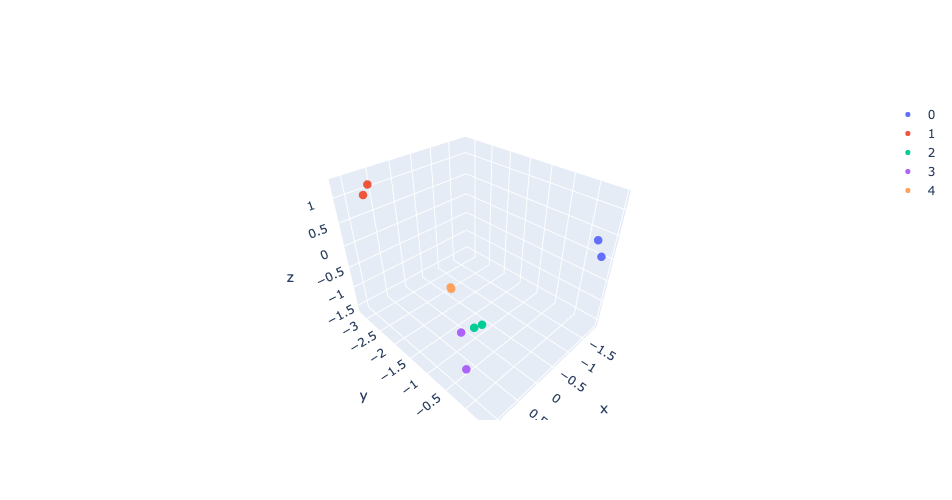

In [327]:
# recon under source condition
data_num = 5
for itr, data in enumerate(sampleloader):
    
    netE.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    target_label = torch.tensor(get_target(data_label, classes, whole=False, shuffle=False))[:,0:1]
    ref_image = get_random_dataset(dataset, data_num).to(device)
    target_image, [_,cenc,_,_,_] = sg.G_transformation(target_label, data_image, True, ref_image)
    
    recon_image, [_,source_enc_cenc,_,_,_] = sg.G_transformation(data_label, target_image, True, data_image)
    ref_image = edge_transformation(recon_image, transformation_type, None, device)
    _, recon_cenc, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(source_enc_cenc.view(data_num,1,-1))
b = cuda2numpy(recon_cenc.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

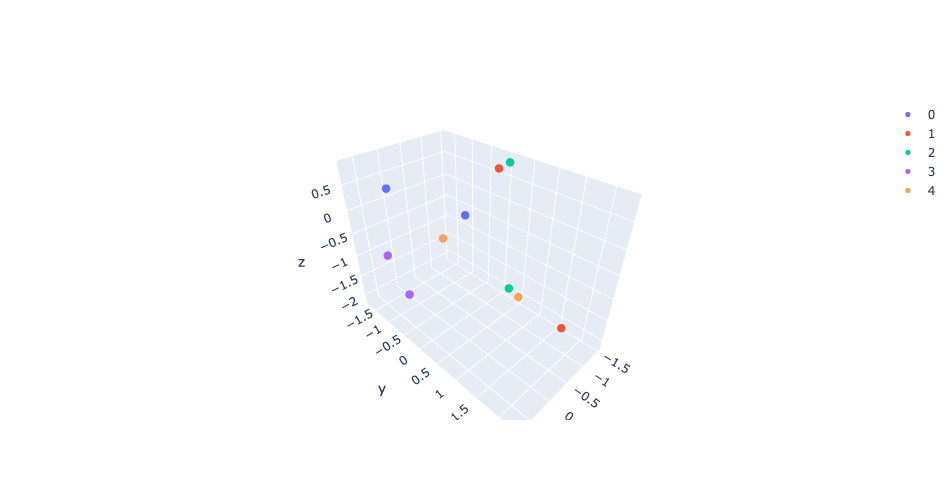

In [136]:
# recon under random condition
data_num = 5
for itr, data in enumerate(sampleloader):
    
    netE.eval()
    sg.E.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    # get target image under random condition
    target_label = torch.tensor(get_target(data_label, classes, whole=False, shuffle=False))[:,0:1]
    target_image, _ = sg.G_transformation(target_label, data_image, True, data_image)
    
    # get reconstructed image under random condition
#     ref_image = get_random_dataset(dataset, len(data_label)).to(device)
    if styleINdataset:
        ref_image = get_random_dataset(dataset, len(data_label), random_seed=1).to(device)
        recon_random_image, [_,source_c_rand,_,_,_] = sg.G_transformation(data_label, target_image, True, ref_image)
    else:
        recon_random_image, source_c_rand = sg.G_transformation(data_label, target_image, False)
    ref_image = edge_transformation(recon_random_image, transformation_type, None, device)
    _, recon_cenc_rand, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(source_c_rand.view(data_num,1,-1))
b = cuda2numpy(recon_cenc_rand.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

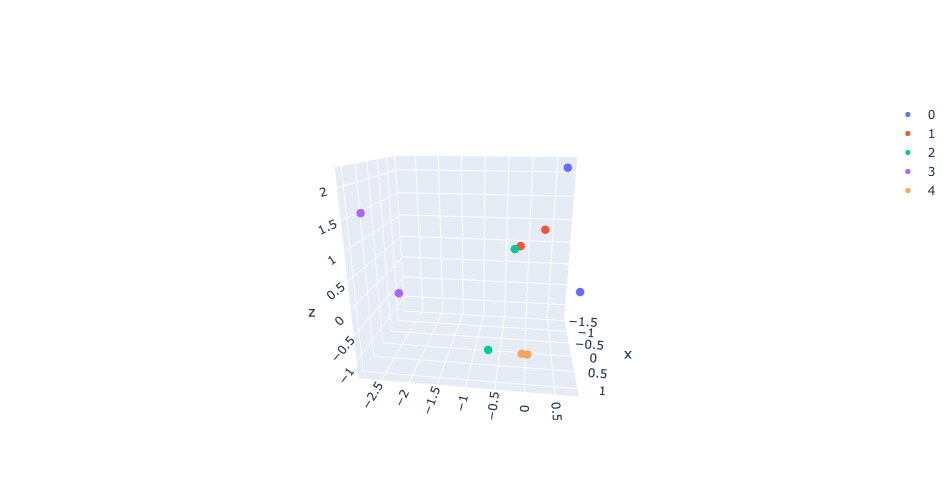

In [137]:
# idt under source condition
data_num = 5
for itr, data in enumerate(sampleloader):
    
    netE.eval()
    sg.E.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    # get idt image under random condition
    idt_random_image, [_,source_c_rand,_,_,_] = sg.G_transformation(data_label, data_image, True, data_image)
    ref_image = edge_transformation(idt_random_image, transformation_type, None, device)
    _, idt_cenc_rand, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(source_c_rand.view(data_num,1,-1))
b = cuda2numpy(idt_cenc_rand.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)

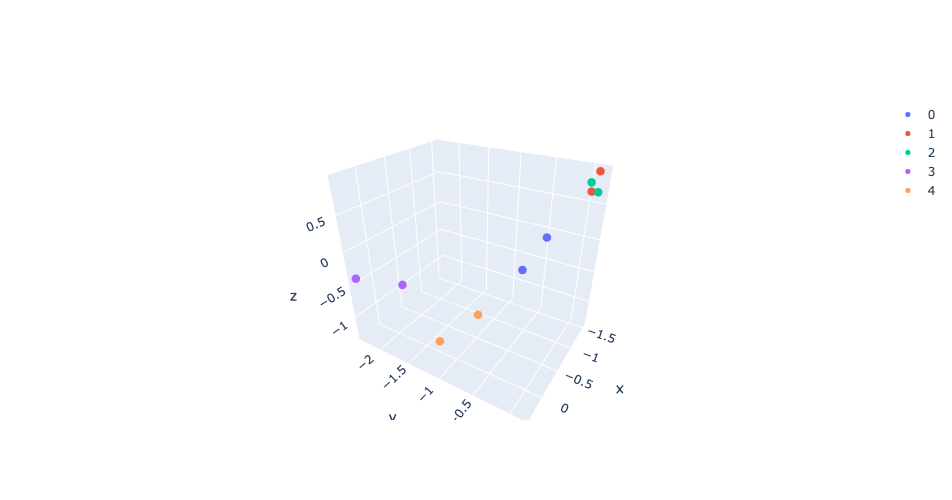

In [138]:
# idt under random condition
data_num = 5
for itr, data in enumerate(sampleloader):
    
    netE.eval()
    sg.E.eval()
    data_image = data[0].to(device)[:data_num]
    data_label = data[1].to(device)[:data_num]
    
    # get idt image under random condition
    if styleINdataset:
        ref_image = get_random_dataset(dataset, len(data_label)).to(device)
        idt_random_image, [_,source_c_rand,_,_,_] = sg.G_transformation(data_label, data_image, True, ref_image)
    else:
        idt_random_image, source_c_rand = sg.G_transformation(data_label, data_image, False)
    ref_image = edge_transformation(idt_random_image, transformation_type, None, device)
    _, idt_cenc_rand, _, _, _ = netE(ref_image)
    
    break
    
trace = []
    
a = cuda2numpy(source_c_rand.view(data_num,1,-1))
b = cuda2numpy(idt_cenc_rand.view(data_num,1,-1))

for i in range(data_num):
    m = np.concatenate([a[i], b[i]], axis=0)
    _x = m[:, 0] 
    _y = m[:, 1]
    _z = m[:, 2]
    trace.append(go.Scatter3d(x=_x, y=_y, z=_z, mode="markers", name=f"{i}", 
                              marker = dict(size=5)))
    
layout = go.Layout(width=500, height=500)    
data = trace
fig = dict(data=data, layout=layout)
iplot(fig)